In [ ]:
import torch

In [ ]:
model = torch.hub.load('ultralytics/yolov5', 'custom', path='./best0101.pt')  # default
Width = 1920
cap = cv2.VideoCapture("http://10.0.0.120:8080/video") # video capture source camera (Here webcam of laptop) 
ret,frame = cap.read() # return a single frame in variable `frame`

cv2.imwrite('image.png',frame)
cap.release()

# Images
imgs = ['image.png']  # batch of images

# Inference
results = model(imgs)

# Results
results.print()
results.show() # or .show()

#results.xyxy[0]  # img1 predictions (tensor) #uncomment this line to get data in form that they gave
#results.pandas().xyxy[0]  # img1 predictions (pandas) #uncomment this line to get data in form that they gave

In [ ]:
import cv2

In [ ]:

import cv2

model = torch.hub.load('ultralytics/yolov5', 'custom', path='./bestDec24.pt')

imgs = ['https://media.crocs.com/images/t_pdphero/f_auto%2Cq_auto/products/10001_75U_ALT140/crocs']  # batch of images

# Inference
results = model(imgs)

# Results
results.print()
results.show() # or .show()
print(results.pandas().xyxy[0])
detects = results.pandas().xyxy[0].to_dict(orient="records")
result = detects[0]
con = result['confidence']
cs = result['class']
#ID = result['ID']
x1 = int(result['xmin'])
y1 = int(result['ymin'])
x2 = int(result['xmax'])
y2 = int(result['ymax'])
# Do whatever you want
#detects[0] gives the array of the object that it detects with the most condfidence, detect[1] will be second most, and so on.
#detects[0]['confidence'] gives the confidence of what is in detects[0]
print("Confidence is " + str(con) )

                 

In [ ]:
#don't run put it in cell that is doing detections.
detects = results.pandas().xyxy[0].to_dict(orient="records")
for result in detects:
                con = result['confidence']
                cs = result['class']
                x1 = int(result['xmin'])
                y1 = int(result['ymin'])
                x2 = int(result['xmax'])
                y2 = int(result['ymax'])
                # Do whatever you want
                print(x1)
                print(y1)
                print(x2)
                print(y2)
                print(con)
                print(cs)

In [13]:
#sends things to arduino
import serial
import time
print("Start")

print("connected")


def forward():

    bluetooth.flushInput()
    for i in range(1):
        print("ping")
        bluetooth.write(str.encode(str(111)))
def Right():

    bluetooth.flushInput()
    for i in range(1):
        print("ping")
        bluetooth.write(str.encode(str(444)))
def Left():

    bluetooth.flushInput()
    for i in range(1):
        print("ping")
        bluetooth.write(str.encode(str(333)))
def runIntake():
    bluetooth.flushInput()
    for i in range(1):
        print("ping")
        bluetooth.write(str.encode(str(6666666666666666)))
        
def TurnWhenNoDet():
    bluetooth.flushInput()
    for i in range(1):
        print("ping")
        bluetooth.write(str.encode(str(444)))


runIntake()

Start
connected
ping


In [11]:
#Below is the main code

In [ ]:
#Below is the main code 

In [1]:
#connects to arduino; run once above main cell
import serial
port="COM3"
bluetooth = serial.Serial(port, 9600)

In [2]:
import torch
import serial
import time
import cv2
model = torch.hub.load('ultralytics/yolov5', 'custom', path='./bestDec24.pt')  # default
Width = 1920
previousPosition = "None"
prevConfidence = 0
def forward():
    bluetooth.flushInput()
    for i in range(1):
        print("ping")
        bluetooth.write(str.encode(str(1)))
def forwardLong():
    bluetooth.flushInput()
    for i in range(1):
        print("ping")
        bluetooth.write(str.encode(str(111)))
def back():
    bluetooth.flushInput()
    for i in range(1):
        print("ping")
        bluetooth.write(str.encode(str(2)))
def Right():

    bluetooth.flushInput()
    for i in range(1):
        print("ping")
        bluetooth.write(str.encode(str(4)))
def Left():

    bluetooth.flushInput()
    for i in range(1):
        print("ping")
        bluetooth.write(str.encode(str(3)))

def runIntake():
    bluetooth.flushInput()
    for i in range(1):
        print("ping")
        bluetooth.write(str.encode(str(6666666666666666666666666666666)))
    
        
def TurnWhenNoDet():
    bluetooth.flushInput()
    for i in range(1):
        print("ping")
        bluetooth.write(str.encode(str(44)))
        
def stop():
    bluetooth.flushInput()
    for i in range(1):
        print("ping")
        bluetooth.write(str.encode(str(5)))
while (True):

    cap = cv2.VideoCapture("http://10.0.0.120:8080/video") # video capture source camera (Here webcam of laptop) 
    ret,frame = cap.read() # return a single frame in variable `frame`
    
    cv2.imwrite('image.png',frame)
    cap.release()

    # Images
    imgs = ['image.png']  # batch of images

    # Inference
    results = model(imgs)

    # Results
    #results.print()
    results.print()
    #results. # or .show()

    #results.xyxy[0]  # img1 predictions (tensor) #uncomment this line to get data in form that they gave
    #results.pandas().xyxy[0]  # img1 predictions (pandas) #uncomment this line to get data in form that they gave
    detects = results.pandas().xyxy[0].to_dict(orient="records")
    for result in detects:
                    con = result['confidence']
                    cs = result['class']
                    x1 = int(result['xmin'])
                    y1 = int(result['ymin'])
                    x2 = int(result['xmax'])
                    y2 = int(result['ymax'])
                    # Do whatever you want
                    centerOfX = (x1+x2)/2
                    print(con)
                    

    print(detects)
    #below i am dividing the picture taken by phone into fifths
    #only one of these fifths is the center so the robot only moves forward when the mask is in that fifth

    if (detects and con>=0.6):
            
            
            if(centerOfX>1152):
                print("right")
                Right()
                previousPosition="Right"
            if(centerOfX<768 and centerOfX>0):
                print("left")
                Left()
                previousPosition="Left"
            if(centerOfX>=768 and centerOfX<=1152):
                print("forward")
                forward()
                previousPosition="Center"
               
        
    elif (previousPosition == "Center"):
        print("Intake Run")
        stop()
        
        forward()
        runIntake()
        
        previousPosition = "None"
        
        
    elif (previousPosition == "Left"):
        print("Intake Run")
        stop()
        
        Left()
        forward()
        runIntake()
        
        previousPosition = "None"
        

    elif (previousPosition == "Right"):
        print("Intake Run")  
        stop()
        
        Right()
        forward()
        runIntake()
        
        previousPosition = "None"
        
        
    else:
        print("turning")
        TurnWhenNoDet()
        stop()
    #prevConfidence = con

Using cache found in C:\Users\navneeth/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2022-12-24 Python-3.8.5 torch-1.10.1 CPU

Fusing layers... 
Model summary: 212 layers, 20852934 parameters, 0 gradients
Adding AutoShape... 
image 1/1: 1080x1920 1 paperMask
Speed: 118.9ms pre-process, 532.3ms inference, 12.3ms NMS per image at shape (1, 3, 384, 640)


0.8401111960411072
[{'xmin': 775.8760986328125, 'ymin': 429.2374267578125, 'xmax': 952.4284057617188, 'ymax': 485.9375, 'confidence': 0.8401111960411072, 'class': 0, 'name': 'paperMask'}]
forward
ping


image 1/1: 1080x1920 1 paperMask
Speed: 91.9ms pre-process, 508.4ms inference, 2.0ms NMS per image at shape (1, 3, 384, 640)


0.6830262541770935
[{'xmin': 786.6710815429688, 'ymin': 421.5604248046875, 'xmax': 976.6375122070312, 'ymax': 484.18487548828125, 'confidence': 0.6830262541770935, 'class': 0, 'name': 'paperMask'}]
forward
ping


image 1/1: 1080x1920 1 paperMask
Speed: 99.6ms pre-process, 558.5ms inference, 1.0ms NMS per image at shape (1, 3, 384, 640)


0.8094596266746521
[{'xmin': 797.5651245117188, 'ymin': 429.9630432128906, 'xmax': 976.7909545898438, 'ymax': 486.1619567871094, 'confidence': 0.8094596266746521, 'class': 0, 'name': 'paperMask'}]
forward
ping


image 1/1: 1080x1920 1 paperMask
Speed: 90.6ms pre-process, 564.4ms inference, 2.1ms NMS per image at shape (1, 3, 384, 640)


0.615358293056488
[{'xmin': 833.5772094726562, 'ymin': 445.3658752441406, 'xmax': 992.4462890625, 'ymax': 501.5640563964844, 'confidence': 0.615358293056488, 'class': 0, 'name': 'paperMask'}]
forward
ping


image 1/1: 1080x1920 1 paperMask
Speed: 90.2ms pre-process, 507.1ms inference, 1.0ms NMS per image at shape (1, 3, 384, 640)


0.8230951428413391
[{'xmin': 907.7803344726562, 'ymin': 437.05389404296875, 'xmax': 1101.35888671875, 'ymax': 495.3641052246094, 'confidence': 0.8230951428413391, 'class': 0, 'name': 'paperMask'}]
forward
ping


image 1/1: 1080x1920 1 paperMask
Speed: 98.5ms pre-process, 466.8ms inference, 5.8ms NMS per image at shape (1, 3, 384, 640)


0.7624627947807312
[{'xmin': 963.6599731445312, 'ymin': 439.1821594238281, 'xmax': 1157.033935546875, 'ymax': 499.028076171875, 'confidence': 0.7624627947807312, 'class': 0, 'name': 'paperMask'}]
forward
ping


image 1/1: 1080x1920 1 paperMask
Speed: 99.3ms pre-process, 546.4ms inference, 2.3ms NMS per image at shape (1, 3, 384, 640)


0.7616859078407288
[{'xmin': 1012.4811401367188, 'ymin': 439.447265625, 'xmax': 1206.9368896484375, 'ymax': 502.2104187011719, 'confidence': 0.7616859078407288, 'class': 0, 'name': 'paperMask'}]
forward
ping


image 1/1: 1080x1920 1 paperMask
Speed: 98.6ms pre-process, 510.6ms inference, 4.8ms NMS per image at shape (1, 3, 384, 640)


0.7330125570297241
[{'xmin': 1056.683837890625, 'ymin': 446.2129211425781, 'xmax': 1256.27685546875, 'ymax': 507.6849060058594, 'confidence': 0.7330125570297241, 'class': 0, 'name': 'paperMask'}]
right
ping


image 1/1: 1080x1920 1 paperMask
Speed: 103.8ms pre-process, 507.3ms inference, 0.0ms NMS per image at shape (1, 3, 384, 640)


0.6922637820243835
[{'xmin': 933.5885620117188, 'ymin': 442.5973205566406, 'xmax': 1138.1656494140625, 'ymax': 505.7123107910156, 'confidence': 0.6922637820243835, 'class': 0, 'name': 'paperMask'}]
forward
ping


image 1/1: 1080x1920 1 paperMask
Speed: 94.5ms pre-process, 558.8ms inference, 1.9ms NMS per image at shape (1, 3, 384, 640)


0.7186944484710693
[{'xmin': 952.0353393554688, 'ymin': 431.9786071777344, 'xmax': 1159.503173828125, 'ymax': 498.30169677734375, 'confidence': 0.7186944484710693, 'class': 0, 'name': 'paperMask'}]
forward
ping


image 1/1: 1080x1920 1 paperMask
Speed: 103.8ms pre-process, 553.9ms inference, 0.0ms NMS per image at shape (1, 3, 384, 640)


0.42022907733917236
[{'xmin': 997.799560546875, 'ymin': 453.4422302246094, 'xmax': 1209.664794921875, 'ymax': 517.0645141601562, 'confidence': 0.42022907733917236, 'class': 0, 'name': 'paperMask'}]
Intake Run
ping
ping
ping


image 1/1: 1080x1920 2 paperMasks
Speed: 95.0ms pre-process, 482.3ms inference, 0.0ms NMS per image at shape (1, 3, 384, 640)


0.7298293113708496
0.3075089156627655
[{'xmin': 1003.784423828125, 'ymin': 441.92449951171875, 'xmax': 1215.63232421875, 'ymax': 508.147705078125, 'confidence': 0.7298293113708496, 'class': 0, 'name': 'paperMask'}, {'xmin': 1718.48291015625, 'ymin': 147.3631591796875, 'xmax': 1794.680419921875, 'ymax': 329.177734375, 'confidence': 0.3075089156627655, 'class': 0, 'name': 'paperMask'}]
turning
ping
ping


KeyboardInterrupt: 

In [ ]:
#below is the new program using location and size of mask in picture to determine when to turn intake

Using cache found in C:\Users\navneeth/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2022-12-24 Python-3.8.5 torch-1.10.1 CPU

Fusing layers... 
Model summary: 212 layers, 20852934 parameters, 0 gradients
Adding AutoShape... 


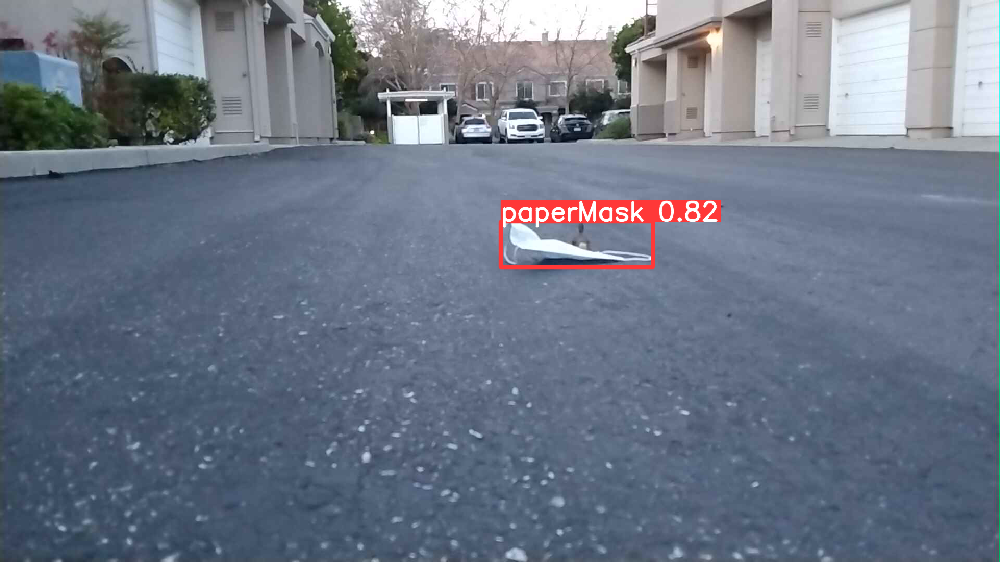

0.8162876963615417
469.0
right
ping


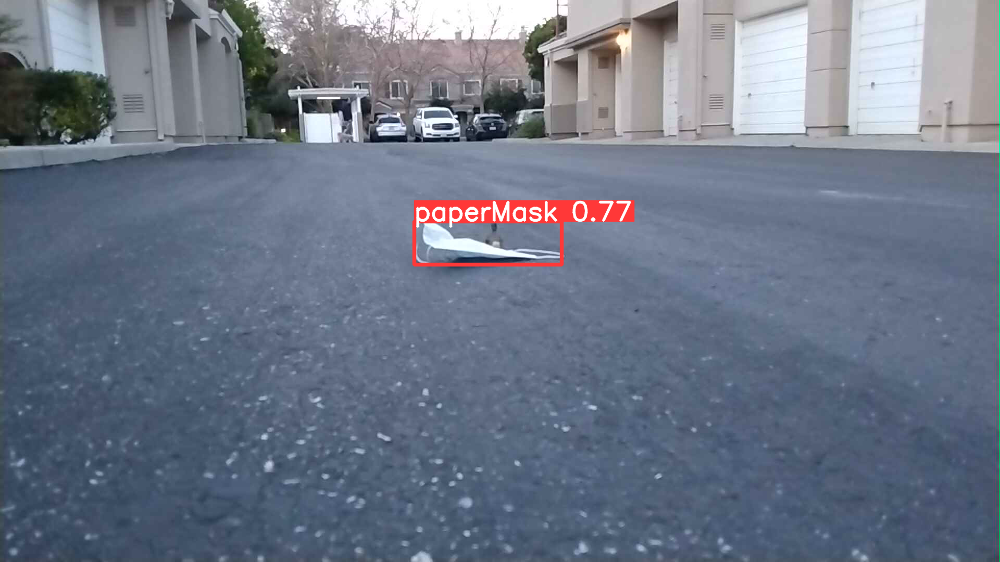

0.7677761316299438
466.5
this has run
forward
ping


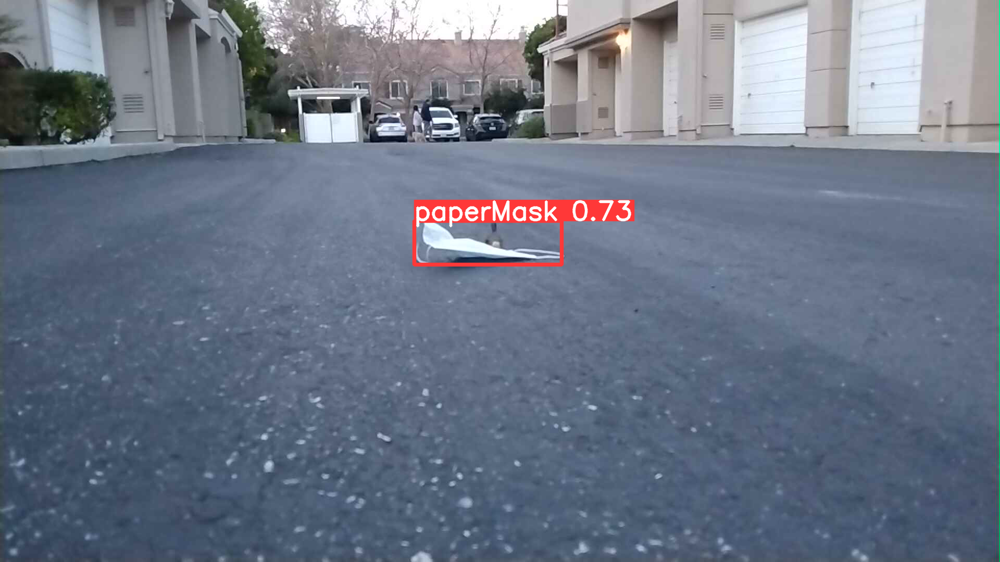

0.7264114022254944
466.0
this has run
forward
ping


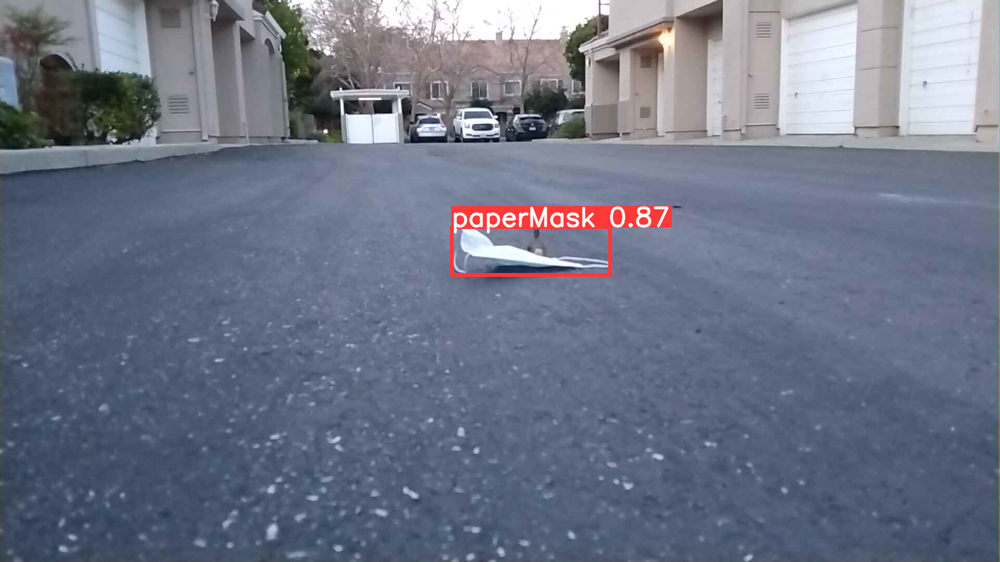

0.8696209788322449
482.0
this has run
forward
ping


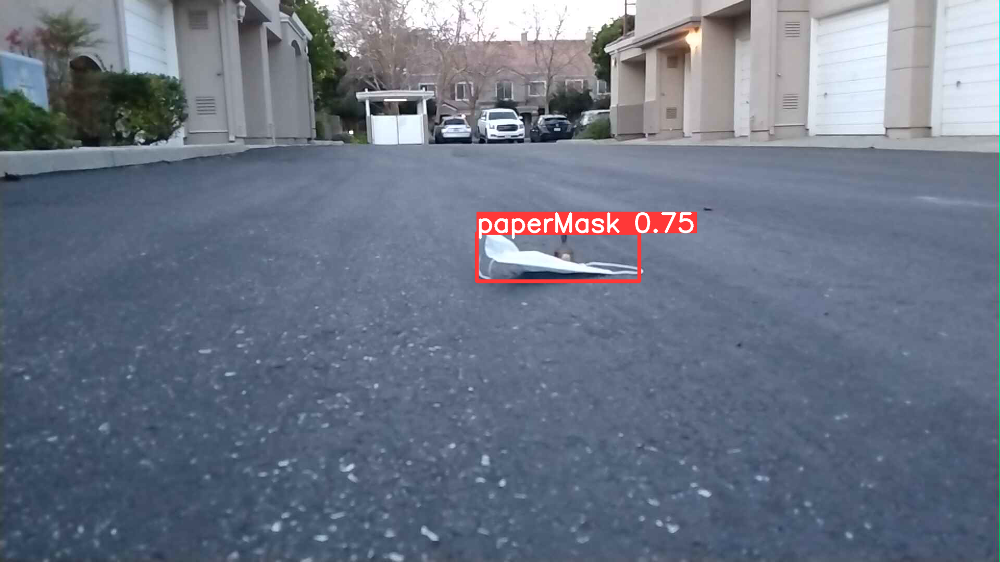

0.7496539950370789
493.5
right
ping


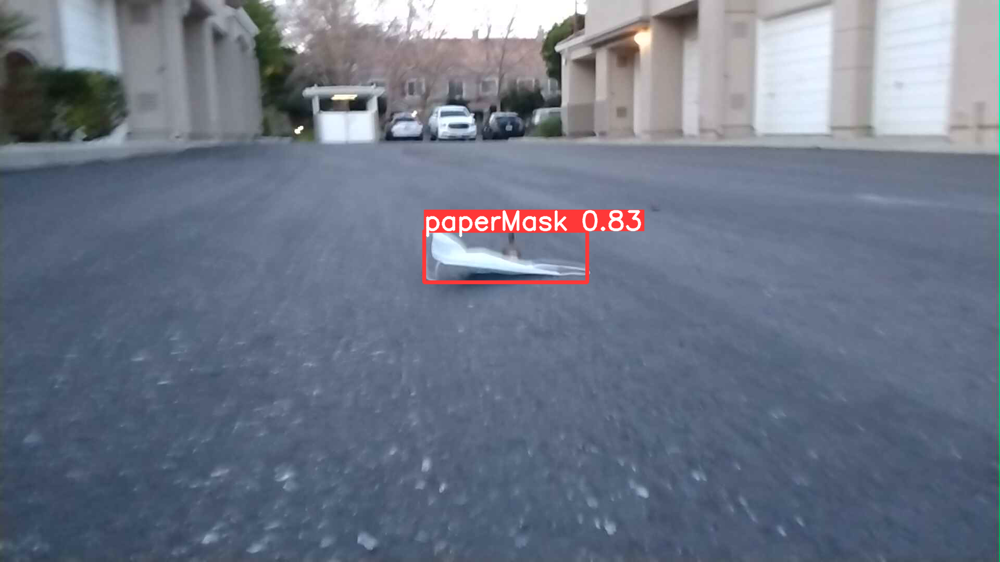

0.8313115239143372
492.5
this has run
forward
ping


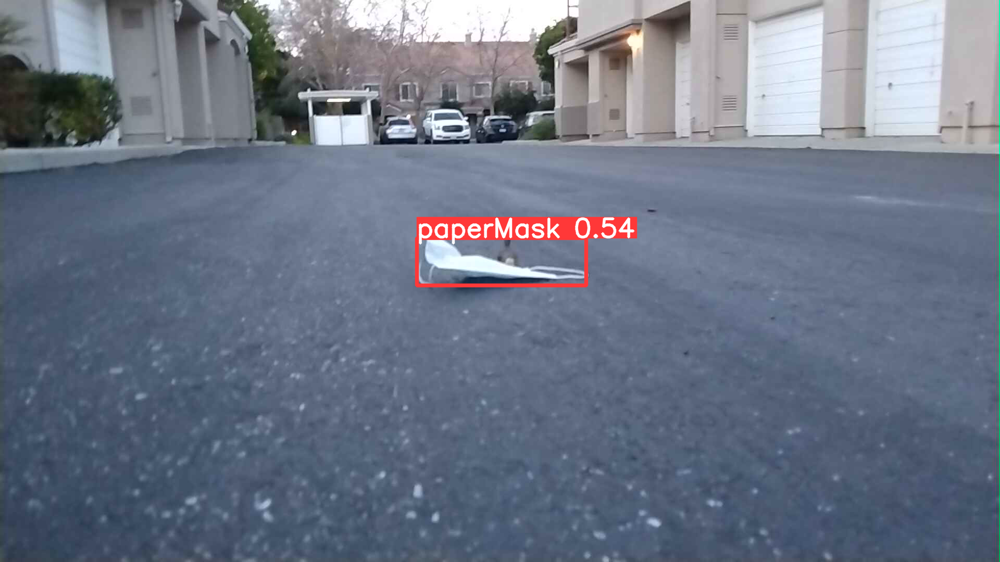

0.5374447703361511
502.5
this has run
forward
ping


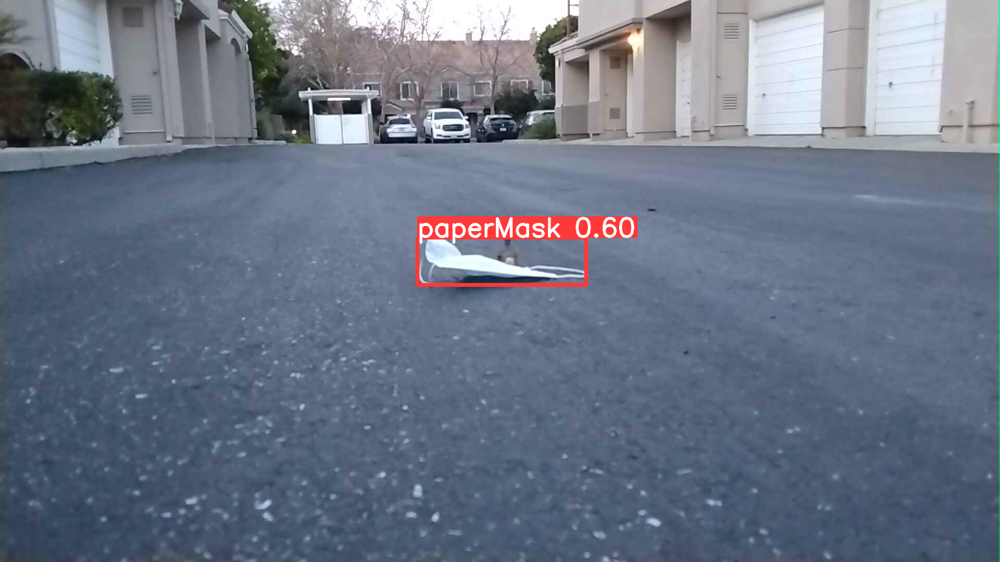

0.5977559685707092
501.5
this has run
forward
ping


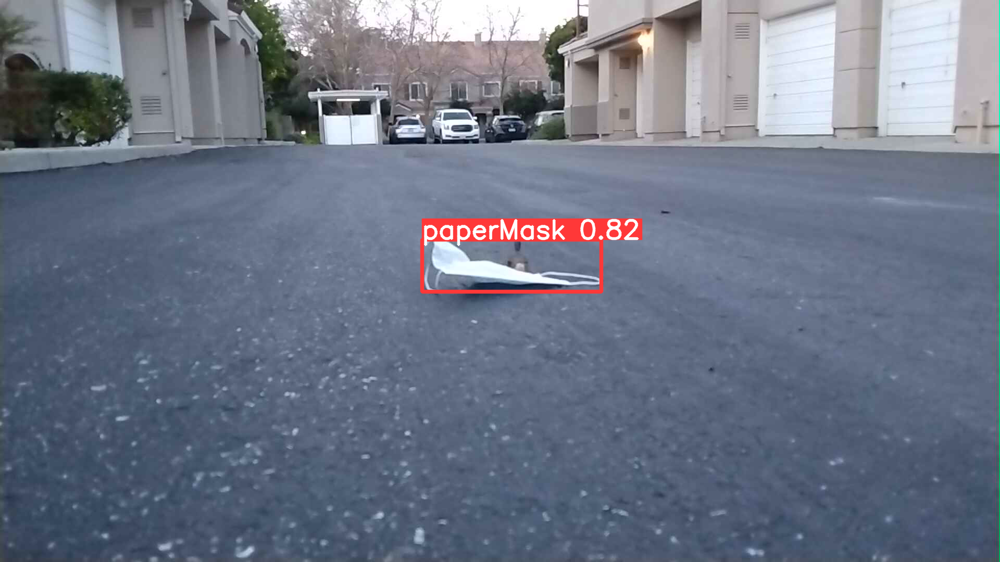

0.8181402683258057
510.0
this has run
forward
ping


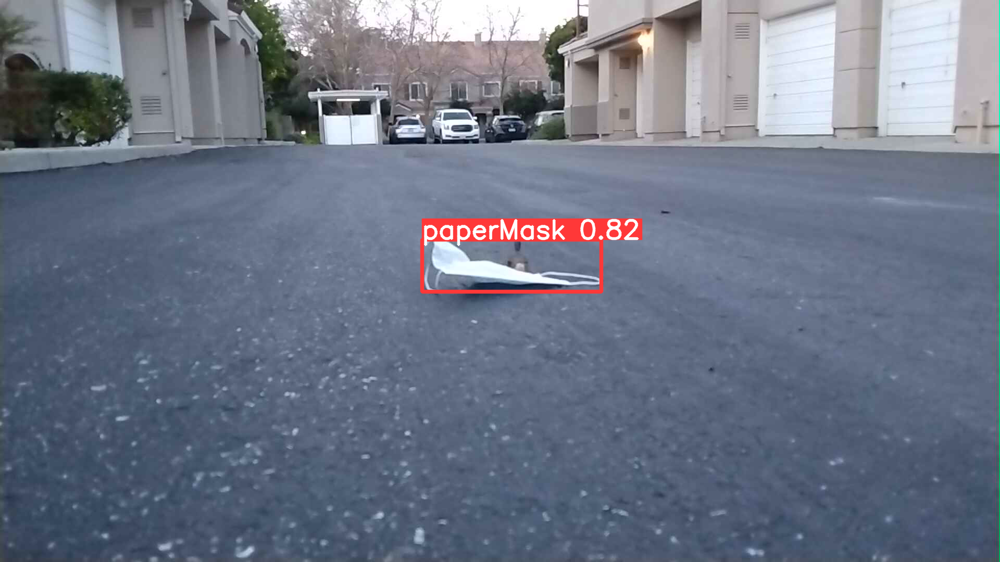

0.8181402683258057
510.0
this has run
forward
ping


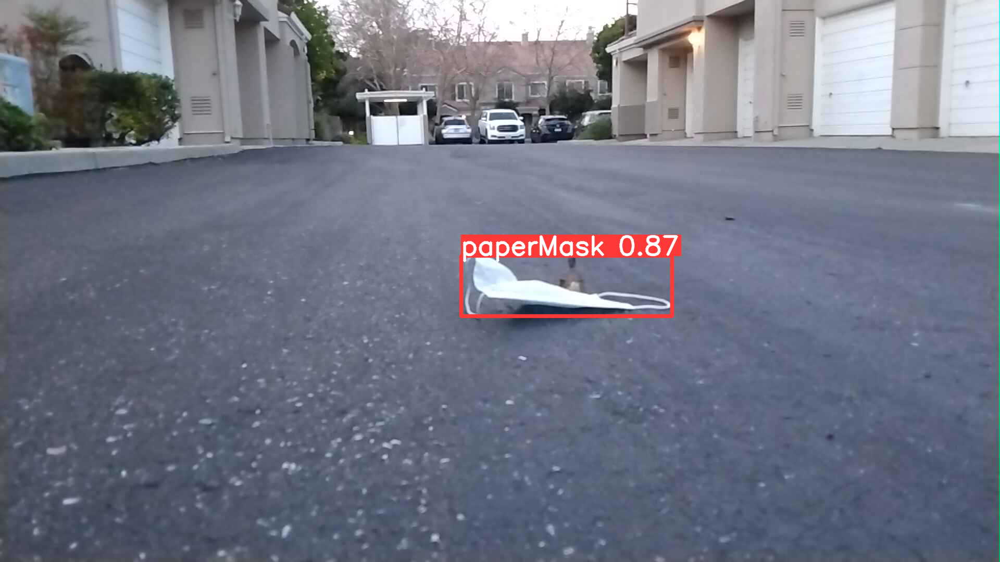

0.8682820796966553
549.0
right
ping


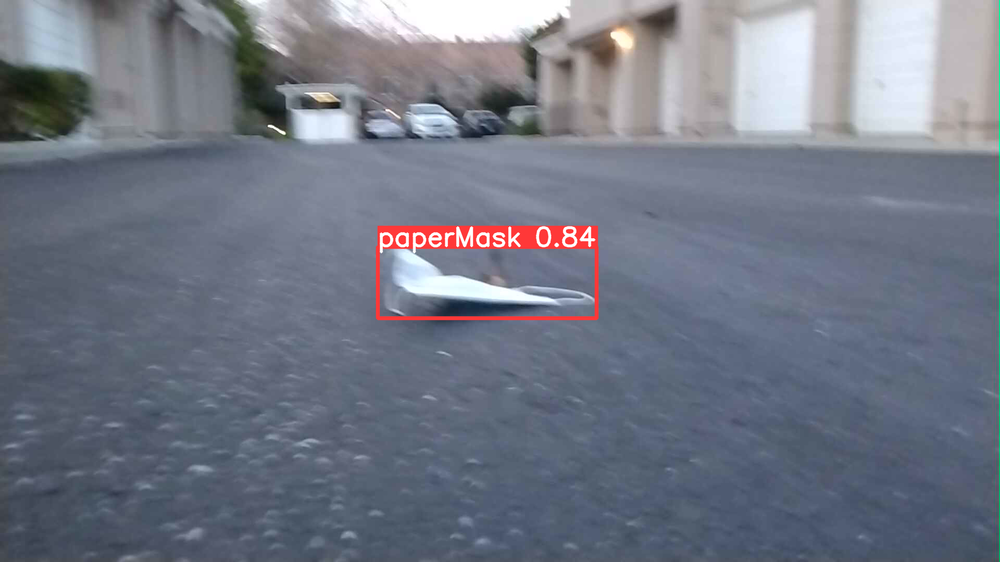

0.8383588790893555
542.5
this has run
forward
ping


KeyboardInterrupt: 

In [5]:
import torch
import serial
import time
import cv2
model = torch.hub.load('ultralytics/yolov5', 'custom', path='./bestDec24.pt')  # default
width = 1920
length = 1080
previousPosition = "None"
prevConfidence = 0
def forward():
    bluetooth.flushInput()
    for i in range(1):
        print("ping")
        bluetooth.write(str.encode(str(1)))

def back():
    bluetooth.flushInput()
    for i in range(1):
        print("ping")
        bluetooth.write(str.encode(str(2)))
def Right():

    bluetooth.flushInput()
    for i in range(1):
        print("ping")
        bluetooth.write(str.encode(str(4)))
def Left():

    bluetooth.flushInput()
    for i in range(1):
        print("ping")
        bluetooth.write(str.encode(str(3)))

def runIntake():
    bluetooth.flushInput()
    for i in range(1):
        print("ping")
        bluetooth.write(str.encode(str(66666666666666666666666666666666)))
    
        
def TurnWhenNoDet():
    bluetooth.flushInput()
    for i in range(1):
        print("ping")
        bluetooth.write(str.encode(str(44)))
        
def stop():
    bluetooth.flushInput()
    for i in range(1):
        print("ping")
        bluetooth.write(str.encode(str(5)))
def check():
    for loopnumber in range(5):
        print("checking whether mask was picked up")
        back()
        
        
while (True):

    cap = cv2.VideoCapture("http://10.0.0.120:8080/video") # video capture source camera (Here webcam of laptop) 
    ret,frame = cap.read() # return a single frame in variable `frame`
    
    cv2.imwrite('image.png',frame)
    cap.release()

    # Images
    imgs = ['image.png']  # batch of images

    # Inference
    results = model(imgs)

    # Results
    results.show()
    #results.show()
    #results 
    # or .show(), .print()
    #results.show()

    #results.xyxy[0]  # img1 predictions (tensor) #uncomment this line to get data in form that they gave
    #results.pandas().xyxy[0]  # img1 predictions (pandas) #uncomment this line to get data in form that they gave
    detects = results.pandas().xyxy[0].to_dict(orient="records")
    
    #below is the code to set the attributes of the object that model is most confident about
    #Note: delete below line if it doesn't work
    if(detects):
        result = detects[0]
        con = result['confidence']
        cs = result['class']
        x1 = int(result['xmin'])
        y1 = int(result['ymin'])
        x2 = int(result['xmax'])
        y2 = int(result['ymax'])
        # Do whatever you want
        centerOfX = (x1+x2)/2
        centerOfY = (y1+y2)/2
        lengthOfObject = (x2-x1)
        heightOfObject = (y2-y1)
        print(con)


    
    #dividing below into 9ths only center 9th will make it move forward

    if (detects and con>=0.5):
            
            print(centerOfY)
            
                    
            if(centerOfX>((width/9)*5)):
                print("right")
                Right()
                time.sleep(0.25)
                previousPosition="Right"
                
            if(centerOfX<((width/9)*4) and centerOfX>0):
                print("left")
                Left()
                time.sleep(0.25)
                previousPosition="Left"
                
            if(centerOfX>=((width/9)*4) and centerOfX<=((width/9)*5)):
                print("this has run")
                if(centerOfY>648):
                    print("forward")
                    forward()                
                    previousPosition="Center" 
                    time.sleep(0.75)
                else:
                    print("forward")
                    forward()                
                    previousPosition="Center"
                    #uncomment below line if movement causes sliding
                    #time.sleep(0.25) 
                
            if (centerOfY>900):
                #Note: maybe add pause between movements here in order to make the movements more precise.

                print("Intake Run")
                stop()
                Left()


                forward()
                forward()
                forward()
                runIntake()

                previousPosition = "None"
                time.sleep(1)
                check()
                time.sleep(3)
        
    else:
        #when no mask is detected, check for masks laying around
        Left()
        Left()
        Left()
        time.sleep(1)